# 🖼️ Clasificación de Imágenes Naturales con Redes Neuronales 🧠🌍

## Trabajo Práctico - Clasificación de Imágenes con Redes Neuronales 2025

**Tecnicatura Universitaria en Inteligencia Artificial**

### Profesores

* Moreyra, Matias
* Cocitto López, Bruno
* Moreyra, Facundo

### Integrantes

* Borgo Elgart, Iair (Legajo: B-6608/7)
* Flaibani, Marcela (Legajo: F-3793/1)
* Nardi, Albano (Legajo: N-1280/7)

## Introducción


Este trabajo aborda un problema de calsificación en el que se pretende predecir las clases de un conjunto de imágenes utilizando redes neuronales con arquitecturas tanto densas como convolucionales para poder lograr un mejor conocimiento práctico de las herramientas disponibles en Tensorflow.


# Importar librerías

In [ ]:
import os
import numpy as np
from pathlib import Path
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from collections import Counter

import tensorflow as tf
from tensorflow.keras.layers import Input, RandomFlip, RandomContrast, RandomTranslation, Flatten, Dropout
from tensorflow.keras.layers import Dense, Conv2D, Add, Activation, MaxPooling2D, GlobalMaxPooling2D, Rescaling, BatchNormalization
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.utils import load_img, img_to_array
import matplotlib.pyplot as plt
from PIL import Image

import zipfile
from pathlib import Path

In [ ]:
# Descarga del dataset

!gdown 1Pqs5Y6dZr4R66Dby5hIUIjPZtBI28rmJ

# Extracción
with zipfile.ZipFile('/content/TP1-3-natural-scenes.zip', 'r') as zip_ref:
    zip_ref.extractall('data')

Downloading...
From (original): https://drive.google.com/uc?id=1Pqs5Y6dZr4R66Dby5hIUIjPZtBI28rmJ
From (redirected): https://drive.google.com/uc?id=1Pqs5Y6dZr4R66Dby5hIUIjPZtBI28rmJ&confirm=t&uuid=d6271c7a-e2d7-41d0-8aed-c18300ac4aff
To: /content/TP1-3-natural-scenes.zip
100% 363M/363M [00:07<00:00, 47.3MB/s]


Establecer GPU por defecto en caso de estar disponible.

In [ ]:
# Configurar para que TensorFlow utilice la GPU por defecto

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        # Configurar para que TensorFlow asigne memoria dinámicamente
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        # Especificar la GPU por defecto
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Manejar error
        print(e)

1 Physical GPUs, 1 Logical GPUs


# Cargar dataset

#### 📁 Organización del conjunto de datos

El proyecto utiliza un conjunto de imágenes categorizadas en directorios según su propósito:

* *Directorio de entrenamiento*: /content/data/seg_train/seg_train
* *Directorio de validación (test)*: /content/data/seg_test/seg_test
* *Directorio para predicciones*: /content/data/seg_pred/seg_pred

Cada una de estas carpetas contiene subdirectorios con el nombre de la clase, y en su interior las imágenes correspondientes a esa categoría. Esta estructura es compatible con la función image_dataset_from_directory de TensorFlow, que permite cargar datos etiquetados automáticamente.

#### 🧹 Preprocesamiento de imágenes

* Las imágenes son de dimensión *150x150 píxeles*.
* Se trabaja con imágenes en *color (3 canales RGB)*.
* Se utiliza un *tamaño de lote (batch size) de 256 imágenes*, lo que permite un entrenamiento eficiente utilizando GPU.
* Las etiquetas se cargan en formato *categorical* (one-hot encoding), lo cual es adecuado para tareas de clasificación multiclase.


#### 🖼️ Visualización de muestras

Para una inspección visual inicial, se muestran 9 imágenes aleatorias del conjunto de entrenamiento junto a su etiqueta correspondiente.

#### 📌 Consideraciones

* El preprocesamiento aquí no incluye normalización de los valores de píxeles (por ejemplo, escalado a \[0, 1]), pero posteriormente se aplica mediante capas de Rescaling .



In [ ]:
base_path = Path("/content")

TRAIN_DATA_DIRECTORY = base_path.joinpath('data', 'seg_train','seg_train')
VALIDATION_DATA_DIRECTORY = base_path.joinpath('data', 'seg_test', 'seg_test')
PREDICTION_DATA_DIRECTORY = base_path.joinpath('data', 'seg_pred', 'seg_pred')

# Tamaño del lote (batch size)
BATCH_SIZE = 256
# Tamaño de las imágenes
IMAGE_HEIGHT = 150
IMAGE_WIDTH = 150

# Carga los datos de entrenamiento y validación
train_ds = tf.keras.utils.image_dataset_from_directory(
    TRAIN_DATA_DIRECTORY,
    label_mode="categorical",
    image_size=(IMAGE_HEIGHT, IMAGE_WIDTH),
    batch_size=BATCH_SIZE)

val_ds = tf.keras.utils.image_dataset_from_directory(
    VALIDATION_DATA_DIRECTORY,
    label_mode="categorical",
    image_size=(IMAGE_HEIGHT, IMAGE_WIDTH),
    batch_size=BATCH_SIZE)


Found 14034 files belonging to 6 classes.
Found 3000 files belonging to 6 classes.


Inspeccionar las clases:

In [ ]:
# Obtiene los nombres de las clases
class_names = train_ds.class_names
num_classes = len(class_names)
print(class_names)

['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


In [ ]:
# Imagen de 150x150 con 3 canales (RGB)
input_shape = (IMAGE_HEIGHT, IMAGE_WIDTH, 3)

Visualizar los datos:

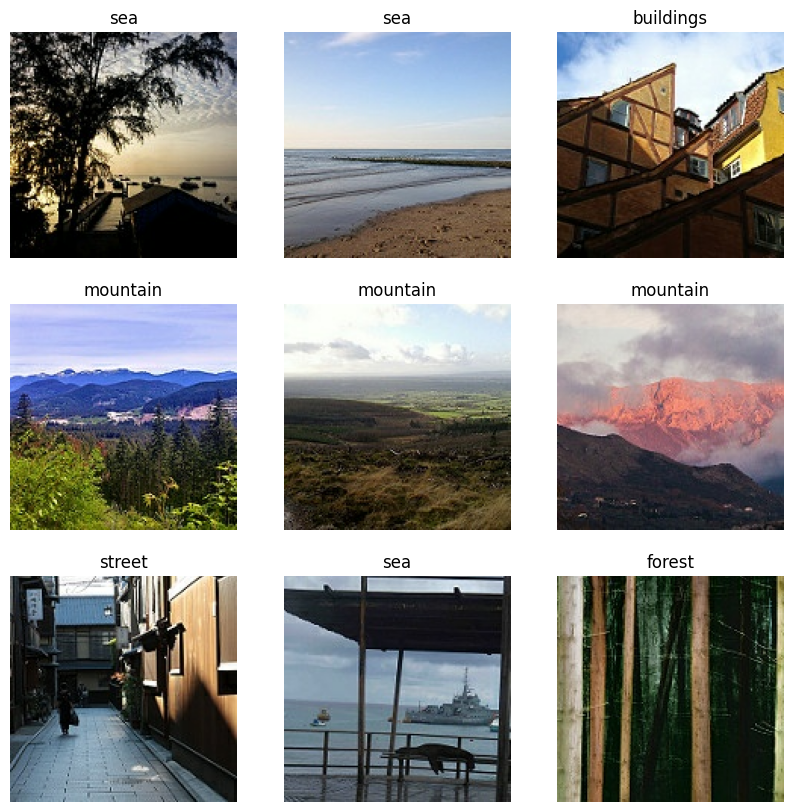

In [ ]:
# Muestra algunas imágenes de ejemplo
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    class_idx = list(labels[i]).index(1)
    plt.title(class_names[class_idx])
    plt.axis("off")

# Modelo con capas densas

## Construcción del modelo

In [ ]:
def build_dense_model(input_shape, num_classes):
    i = Input(shape=input_shape)
    x = Rescaling(1./255)(i)


    # Aumentacion de datos
    x = RandomFlip("horizontal_and_vertical")(x)
    x = RandomContrast(0.2)(x)
    x = RandomTranslation(0.1, 0.1)(x)
    x = Flatten()(x)

    # Capas densas
    x = Dense(128, activation="relu")(x)
    x = Dense(64, activation="relu")(x)

    x = Dense(num_classes)(x)
    x = Activation("softmax")(x)

    return tf.keras.Model(inputs=i, outputs=[x])

In [ ]:
print("Building model")
model_dense = build_dense_model(input_shape, num_classes)

model_dense.summary()

Building model


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_flip (RandomFlip)        │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_contrast                 │ (None, 150, 150, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_translation              │ (None, 150, 150, 3)    │             0 │
│ (RandomTranslation)             │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 67500)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     8,640,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 6)              │           390 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 6)              │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,648,774 (32.99 MB)

 Trainable params: 8,648,774 (32.99 MB)

 Non-trainable params: 0 (0.00 B)

## Entrenamiento

In [ ]:
model_dense.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),  # Usamos Adam como optimizador
    loss='categorical_crossentropy',                          # Función de pérdida para clasificación multiclase
    metrics=['accuracy']                                      # Métricas para evaluar el desempeño
)

In [ ]:
EPOCHS = 200
early_stopping = EarlyStopping(monitor="val_loss", patience=20, verbose=0, mode="min")
checkpoint_acc = ModelCheckpoint(
    "model_dense-e{epoch:02d}-loss{val_loss:.3f}-acc{val_accuracy:.3f}.keras",
    save_best_only=True,
    monitor="val_accuracy",
    initial_value_threshold=0.5,
    mode="max",
)

# Entrenar el modelo
history = model_dense.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=[checkpoint_acc, early_stopping],
)


Epoch 1/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - accuracy: 0.2173 - loss: 15.2105 - val_accuracy: 0.3083 - val_loss: 2.3664
Epoch 2/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step - accuracy: 0.3554 - loss: 1.8763 - val_accuracy: 0.3893 - val_loss: 1.8395
Epoch 3/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 11s 99ms/step - accuracy: 0.3681 - loss: 1.9623 - val_accuracy: 0.3270 - val_loss: 1.7063
Epoch 4/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 7s 133ms/step - accuracy: 0.3952 - loss: 1.7049 - val_accuracy: 0.3007 - val_loss: 2.2513
Epoch 5/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 6s 103ms/step - accuracy: 0.3950 - loss: 1.7584 - val_accuracy: 0.4700 - val_loss: 1.4634
Epoch 6/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 6s 111ms/step - accuracy: 0.4611 - loss: 1.4384 - val_accuracy: 0.4900 - val_loss: 1.3595
Epoch 7/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.4607 - loss: 1.4608 - val_accuracy: 0.4950 - val_loss: 1.3716
Epoch 8/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 10s 103ms/step - accuracy: 0.4517 - loss: 1.5427 - val_acc

Se logra un modelo con 58.2% de precisión en validación, con 8,640,128 parámetros. Se probará si con otros tipos de modelos se llegan a mejores resultados.

## Gráficas de precisión y pérdida en entrenamiento y validación

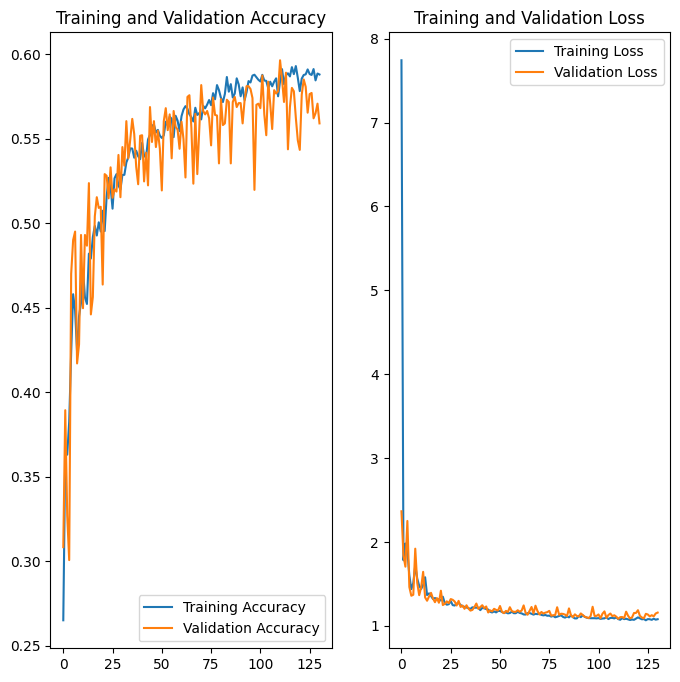

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

Se ven gráficas algo ruidosas pero de una convergencia aceptable.

## Predicciones

Con datos de validación

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


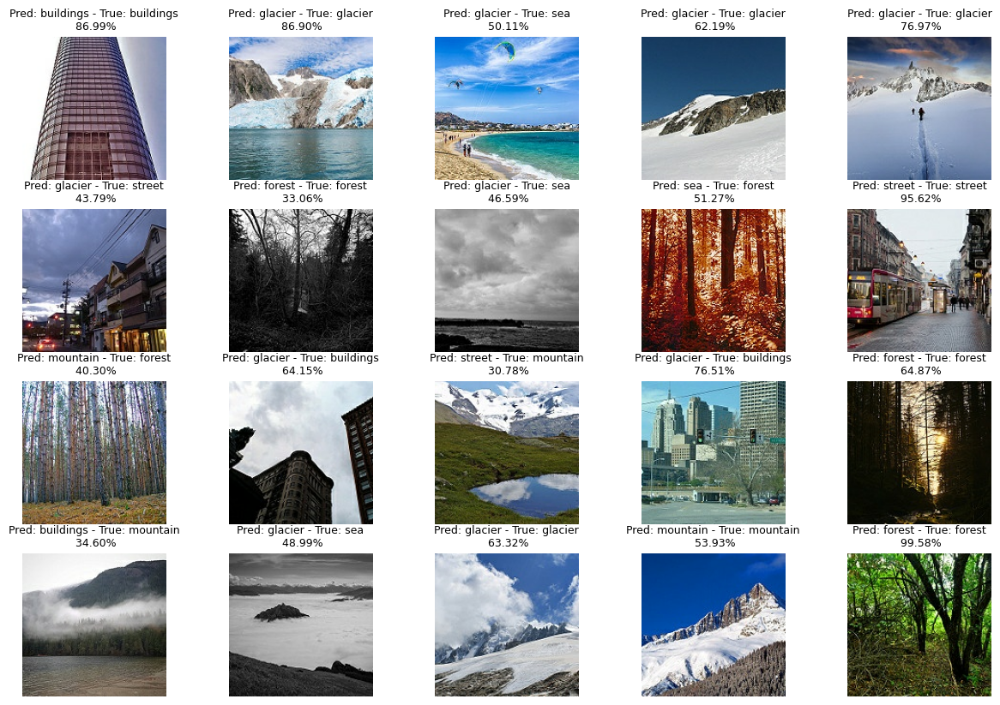

In [ ]:
# Obtener un batch de val_ds (32 imagenes por batch)
for images, labels in val_ds.take(1):
  sample_images = images[:20]
  sample_labels = labels[:20]
  break

predictions = model_dense.predict(sample_images)

# Crear subplot 4 x 5
fig, axes = plt.subplots(4, 5, figsize=(15, 10))

for idx, ax in enumerate(axes.flat):
  img = sample_images[idx]
  predict_class = class_names[np.argmax(predictions[idx])]
  true_class = class_names[np.argmax(sample_labels[idx])]
  confidence = np.max(predictions[idx]) * 100

  ax.imshow(img.numpy().astype("uint8"))
  ax.set_title(f"Pred: {predict_class} - True: {true_class}\n {confidence:.2f}%", fontsize=9)
  ax.axis('off')

plt.show()

Con datos de testeo

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


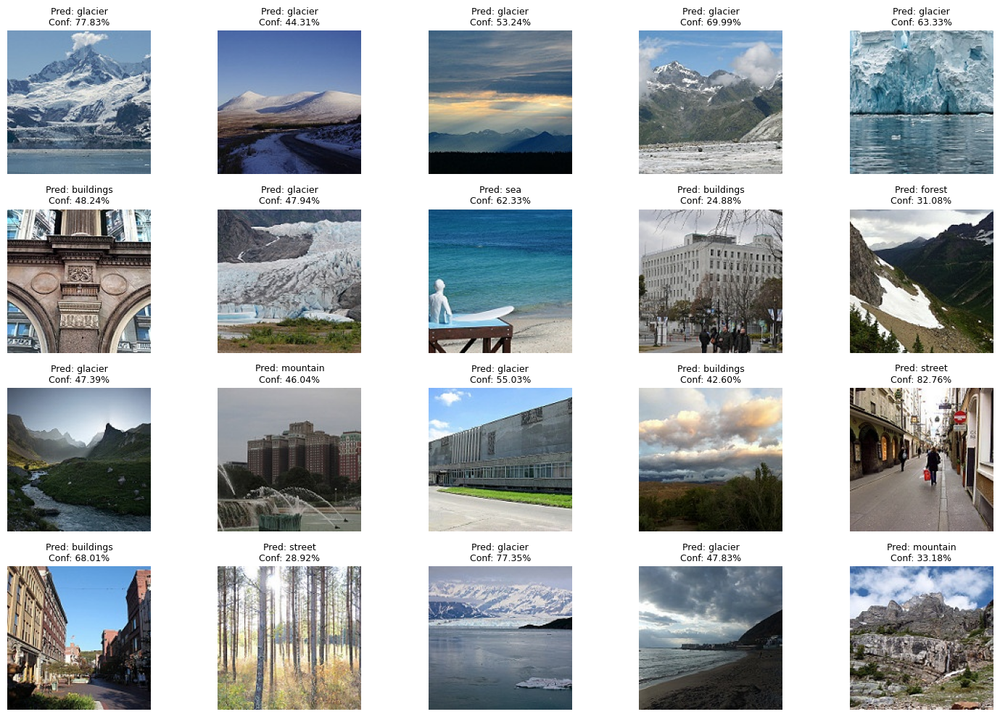

In [ ]:
image_paths = list(PREDICTION_DATA_DIRECTORY.glob("*.jpg"))

# Limitar a 20 imágenes
sample_image_paths = image_paths[:20]

# Cargar imágenes
sample_images = []
for path in sample_image_paths:
    img = load_img(path, target_size=(IMAGE_HEIGHT, IMAGE_WIDTH))
    img_array = img_to_array(img)
    sample_images.append(img_array)

# Convertir a tensor y no es necesario escalar
sample_images = np.array(sample_images)

predictions = model_dense.predict(sample_images)

fig, axes = plt.subplots(4, 5, figsize=(15, 10))
for idx, ax in enumerate(axes.flat):
    img = sample_images[idx]
    predict_class = class_names[np.argmax(predictions[idx])]
    confidence = np.max(predictions[idx]) * 100

    ax.imshow(img.astype("uint8"))
    ax.set_title(f"Pred: {predict_class}\nConf: {confidence:.2f}%", fontsize=9)
    ax.axis('off')

plt.tight_layout()
plt.show()


En algunas imágenes logra una confianza y predicción buena, en otras tiene una confianza baja y puede errar a la etiqueta asignada

# Modelo con capas convolucionales y densas

## Construcción del modelo

In [ ]:
# Función para construir el modelo
def build_conv_model(input_shape, num_classes):
    i = Input(input_shape)

    x = Rescaling(1./255)(i)

    x = RandomFlip("horizontal_and_vertical")(x)
    x = RandomContrast(0.2)(x)
    x = RandomTranslation(0.1, 0.1)(x)

    x = Conv2D(16, (3, 3), padding = 'same')(x)
    x = Activation("relu")(x)
    x = MaxPooling2D((2, 2))(x)

    x = Conv2D(32, (3, 3), padding = 'same')(x)
    x = Activation("relu")(x)
    x = MaxPooling2D((2, 2))(x)

    x = Conv2D(64, (3, 3), padding = 'same')(x)
    x = Activation("relu")(x)
    x = MaxPooling2D((2, 2))(x)

    x = Flatten()(x)

    x = Dense(num_classes)(x)
    x = Activation("softmax")(x)
    return tf.keras.Model(inputs=i, outputs=[x])

In [ ]:
print("Building model")
model_conv = build_conv_model(input_shape, num_classes)

model_conv.summary()

Building model


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_2 (Rescaling)         │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_flip_2 (RandomFlip)      │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_contrast_2               │ (None, 150, 150, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_translation_2            │ (None, 150, 150, 3)    │             0 │
│ (RandomTranslation)             │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 150, 150, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_5 (Activation)       │ (None, 150, 150, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 75, 75, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 75, 75, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_6 (Activation)       │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 37, 37, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 37, 37, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_7 (Activation)       │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 18, 18, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 20736)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 6)              │       124,422 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_8 (Activation)       │ (None, 6)              │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 148,006 (578.15 KB)

 Trainable params: 148,006 (578.15 KB)

 Non-trainable params: 0 (0.00 B)

Se logra un modelo de 148,006 parámetros, menos del 2% del modelo anterior.

## Entrenamiento

In [ ]:
model_conv.compile(
    optimizer='adam',
    loss="categorical_crossentropy",
    metrics=['accuracy'])

In [ ]:
EPOCHS = 200
early_stopping = EarlyStopping(monitor="val_loss", patience=20, verbose=0, mode="min")
checkpoint_acc = ModelCheckpoint(
    "model_conv-e{epoch:02d}-loss{val_loss:.3f}-acc{val_accuracy:.3f}.keras",
    save_best_only=True,
    monitor="val_accuracy",
    initial_value_threshold=0.7,
    mode="max",
)

# Entrenar el modelo
history = model_conv.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=[checkpoint_acc, early_stopping],
)

Epoch 1/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - accuracy: 0.3865 - loss: 1.4663 - val_accuracy: 0.5997 - val_loss: 1.0970
Epoch 2/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 7s 132ms/step - accuracy: 0.6070 - loss: 1.0385 - val_accuracy: 0.6753 - val_loss: 0.8804
Epoch 3/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 11s 144ms/step - accuracy: 0.6705 - loss: 0.8888 - val_accuracy: 0.6670 - val_loss: 0.9089
Epoch 4/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 7s 131ms/step - accuracy: 0.6890 - loss: 0.8335 - val_accuracy: 0.7317 - val_loss: 0.7524
Epoch 5/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 9s 107ms/step - accuracy: 0.7187 - loss: 0.7710 - val_accuracy: 0.7083 - val_loss: 0.8101
Epoch 6/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 8s 140ms/step - accuracy: 0.7242 - loss: 0.7458 - val_accuracy: 0.7130 - val_loss: 0.7652
Epoch 7/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 10s 138ms/step - accuracy: 0.7371 - loss: 0.7115 - val_accuracy: 0.7287 - val_loss: 0.7295
Epoch 8/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 9s 108ms/step - accuracy: 0.7435 - loss: 0.7008 - val_ac

No solo se logra un modelo de menor tamaño, sino que también se puede ver el poder que tienen las capas convolucionales en captar información local de los píxeles, logrando una precisión mucho mayor (86% aprox).

## Gráficas de precisión y pérdida en entrenamiento y validación

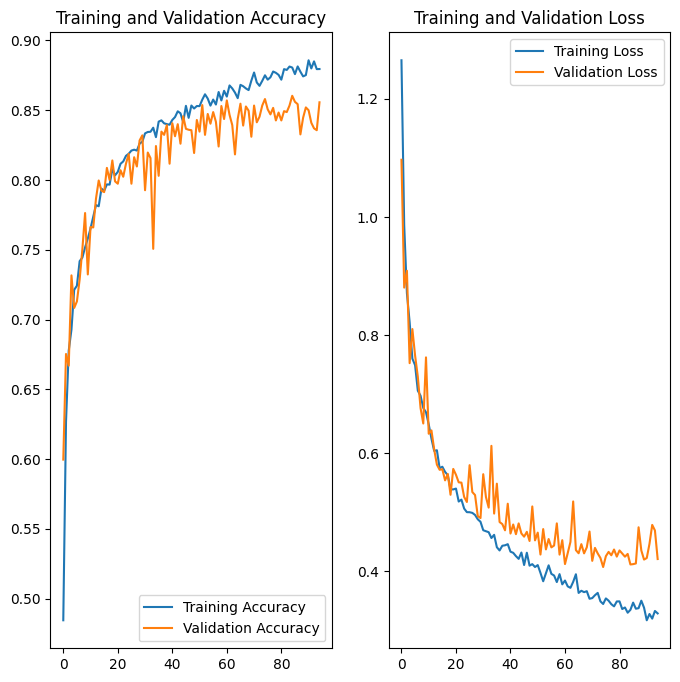

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

Las gráficas se ven menos ruidosas que en el modelo anterior, notamos un leve overfitting en las últimas épocas de entrenamiento. El modelo guardado es previo al sobreajuste.

## Predicciones

Con datos de validación

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 264ms/step


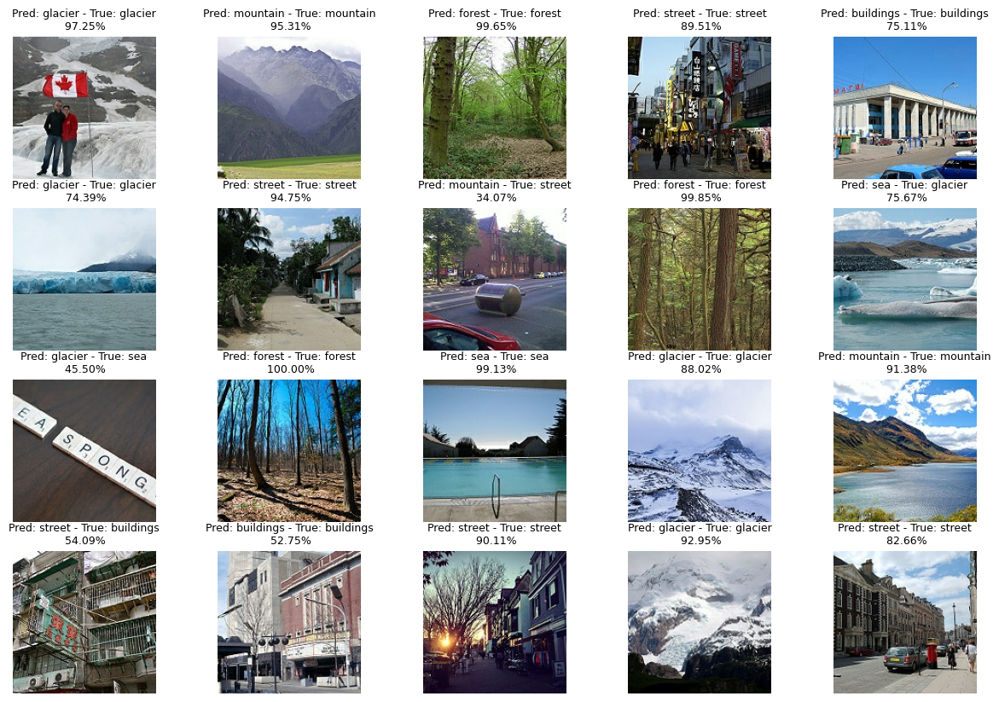

In [ ]:
# Obtener un batch de val_ds (32 imagenes por batch)
for images, labels in val_ds.take(1):
  sample_images = images[:20]
  sample_labels = labels[:20]
  break

predictions = model_conv.predict(sample_images)

# Crear subplot 4 x 5
fig, axes = plt.subplots(4, 5, figsize=(15, 10))

for idx, ax in enumerate(axes.flat):
  img = sample_images[idx]
  predict_class = class_names[np.argmax(predictions[idx])]
  true_class = class_names[np.argmax(sample_labels[idx])]
  confidence = np.max(predictions[idx]) * 100

  ax.imshow(img.numpy().astype("uint8"))
  ax.set_title(f"Pred: {predict_class} - True: {true_class}\n {confidence:.2f}%", fontsize=9)
  ax.axis('off')

plt.show()

Con este modelo se logra una confianza mucho mayor en las predicciónes, aunque sigue habiendo errores más difíciles de hallar.

Con datos de testeo

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


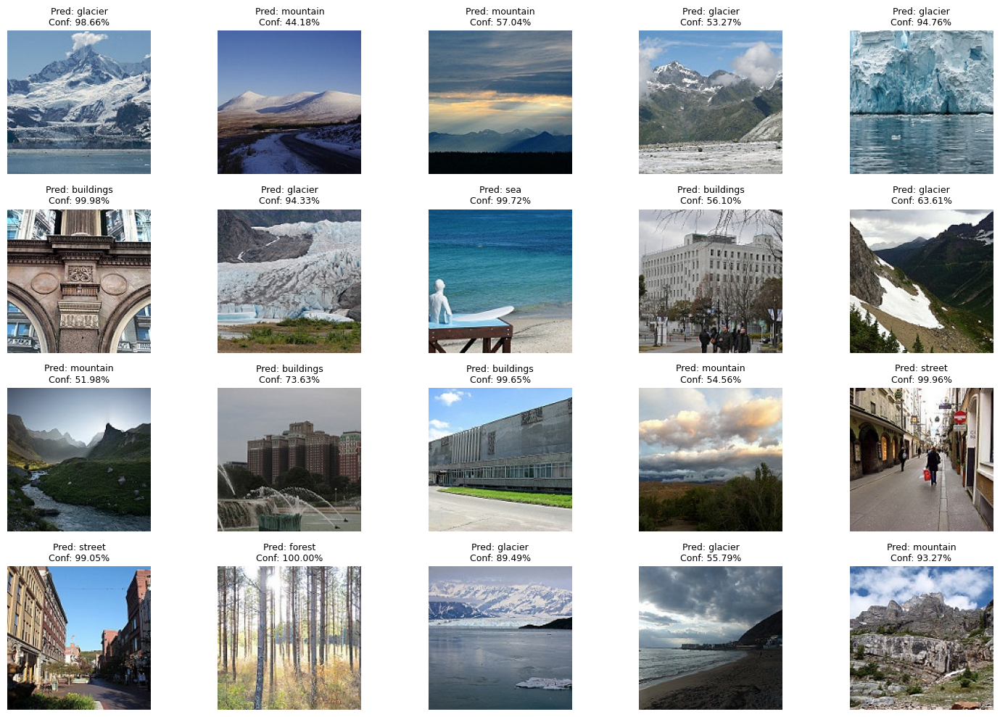

In [ ]:
image_paths = list(PREDICTION_DATA_DIRECTORY.glob("*.jpg"))
# Limitar a 20 imágenes
sample_image_paths = image_paths[:20]

# Cargar imágenes
sample_images = []
for path in sample_image_paths:
    img = load_img(path, target_size=(IMAGE_HEIGHT, IMAGE_WIDTH))
    img_array = img_to_array(img)
    sample_images.append(img_array)

# Convertir a tensor y no es necesario escalar
sample_images = np.array(sample_images)

predictions = model_conv.predict(sample_images)

fig, axes = plt.subplots(4, 5, figsize=(15, 10))
for idx, ax in enumerate(axes.flat):
    img = sample_images[idx]
    predict_class = class_names[np.argmax(predictions[idx])]
    confidence = np.max(predictions[idx]) * 100

    ax.imshow(img.astype("uint8"))
    ax.set_title(f"Pred: {predict_class}\nConf: {confidence:.2f}%", fontsize=9)
    ax.axis('off')

plt.tight_layout()
plt.show()

# Modelo que incluya bloques residuales identidad

## Construcción del modelo

In [ ]:
def identity_block(x, filters):
  conv = Conv2D(filters[0], 3, padding='same', strides = (1,1))(x)
  conv = BatchNormalization()(conv)
  conv = Activation('relu')(conv)

  conv = Conv2D(filters[1],  3, padding='same', strides = (1,1))(conv)
  conv = BatchNormalization()(conv)

  # Convolucin 1x1 para que tenga la misma dimension que los filtros de antes
  x = Conv2D(filters[1], 1, padding='same', strides=(1, 1))(x)

  result = Add()([x, conv])
  result = Activation('relu')(result)

  return result

In [ ]:
def build_residual_model(input_shape, num_classes, filters = [8, 16, 32, 64]):
    i = Input(input_shape)

    x = Rescaling(1./255)(i)

    x = RandomFlip("horizontal_and_vertical")(x)
    x = RandomContrast(0.2)(x)
    x = RandomTranslation(0.1, 0.1)(x)


    x = identity_block(x, filters[0:2])
    x = MaxPooling2D((2, 2))(x)

    x = identity_block(x, filters[2:4])
    x = MaxPooling2D((2, 2))(x)

    x = Flatten()(x)
    x = Dense(num_classes, activation='softmax')(x)

    return tf.keras.Model(inputs=i, outputs=x)


In [ ]:
model_resi = build_residual_model(input_shape, num_classes)

model_resi.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_3         │ (None, 150, 150,  │          0 │ input_layer_3[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ random_flip_3       │ (None, 150, 150,  │          0 │ rescaling_3[0][0] │
│ (RandomFlip)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ random_contrast_3   │ (None, 150, 150,  │          0 │ random_flip_3[0]… │
│ (RandomContrast)    │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ random_translation… │ (None, 150, 150,  │          0 │ random_contrast_… │
│ (RandomTranslation) │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 150, 150,  │        224 │ random_translati… │
│                     │ 8)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 150, 150,  │         32 │ conv2d_6[0][0]    │
│ (BatchNormalizatio… │ 8)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_9        │ (None, 150, 150,  │          0 │ batch_normalizat… │
│ (Activation)        │ 8)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 150, 150,  │      1,168 │ activation_9[0][… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 150, 150,  │         64 │ random_translati… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 150, 150,  │         64 │ conv2d_7[0][0]    │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 150, 150,  │          0 │ conv2d_8[0][0],   │
│                     │ 16)               │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_10       │ (None, 150, 150,  │          0 │ add[0][0]         │
│ (Activation)        │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_6     │ (None, 75, 75,    │          0 │ activation_10[0]… │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 75, 75,    │      4,640 │ max_pooling2d_6[… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 75, 75,    │        128 │ conv2d_9[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_11       │ (None, 75, 75,    │          0 │ batch_normalizat

 Total params: 551,862 (2.11 MB)

 Trainable params: 551,622 (2.10 MB)

 Non-trainable params: 240 (960.00 B)

Se construye un modelo con bloque residual, con un total de 551,862 parámetros.

## Entrenamiento

In [ ]:
model_resi.compile(
    optimizer='adam',
    loss="categorical_crossentropy",
    metrics=['accuracy'])

In [ ]:
EPOCHS = 200
early_stopping = EarlyStopping(monitor="val_loss", patience=20, verbose=0, mode="min")
checkpoint_acc = ModelCheckpoint(
    "model_residual-e{epoch:02d}-loss{val_loss:.3f}-acc{val_accuracy:.3f}.keras",
    save_best_only=True,
    monitor="val_accuracy",
    initial_value_threshold=0.7,
    mode="max",
)

# Entrenar el modelo
history = model_resi.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=[checkpoint_acc, early_stopping],
)

Epoch 1/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 38s 554ms/step - accuracy: 0.3015 - loss: 24.8943 - val_accuracy: 0.1923 - val_loss: 3.4509
Epoch 2/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 33s 473ms/step - accuracy: 0.5424 - loss: 1.3709 - val_accuracy: 0.2800 - val_loss: 2.4888
Epoch 3/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 26s 469ms/step - accuracy: 0.6037 - loss: 1.0945 - val_accuracy: 0.2210 - val_loss: 2.9840
Epoch 4/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 27s 492ms/step - accuracy: 0.6362 - loss: 1.0280 - val_accuracy: 0.2607 - val_loss: 2.3124
Epoch 5/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 26s 470ms/step - accuracy: 0.6727 - loss: 0.9386 - val_accuracy: 0.2557 - val_loss: 2.0311
Epoch 6/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 42s 491ms/step - accuracy: 0.7053 - loss: 0.8264 - val_accuracy: 0.5043 - val_loss: 1.2385
Epoch 7/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 26s 475ms/step - accuracy: 0.7157 - loss: 0.8015 - val_accuracy: 0.5700 - val_loss: 1.0241
Epoch 8/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 41s 467ms/step - accuracy: 0.7285 - loss: 0.7553 -

No se logra una mejor precisión que con el modelo convolucional. Cabe destacar que sin el aumento de datos este modelo sobreajusta rápidamente a los datos de entrenamiento llegando a una precisión del 99% pero quedando con una precisión en validación del 75%.

## Gráficas de precisión y pérdida en entrenamiento y validación

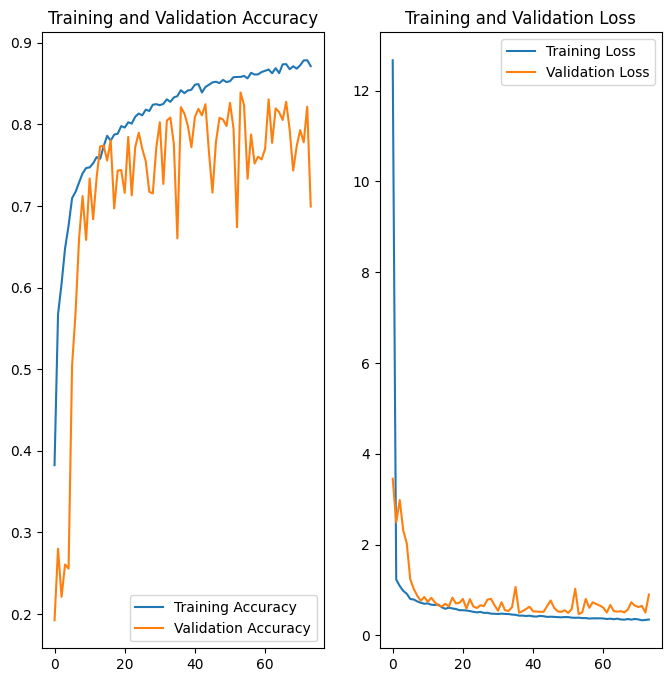

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

Entrena en menos épocas que el modelo convolucional, pero al ser un modelo mucho más pesado y con peores métricas, no nos parece el modelo a utilizar en este problema.

## Predicciones

Con datos de validación

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step


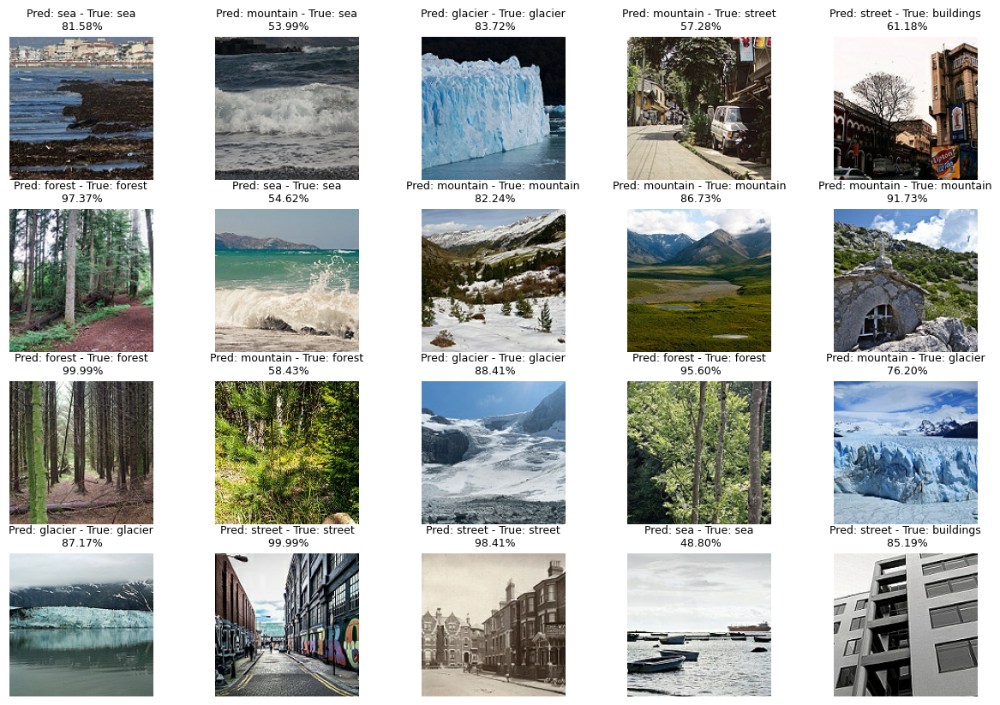

In [ ]:
# Obtener un batch de val_ds (32 imagenes por batch)
for images, labels in val_ds.take(1):
  sample_images = images[:20]
  sample_labels = labels[:20]
  break

predictions = model_resi.predict(sample_images)

# Crear subplot 4 x 5
fig, axes = plt.subplots(4, 5, figsize=(15, 10))

for idx, ax in enumerate(axes.flat):
  img = sample_images[idx]
  predict_class = class_names[np.argmax(predictions[idx])]
  true_class = class_names[np.argmax(sample_labels[idx])]
  confidence = np.max(predictions[idx]) * 100

  ax.imshow(img.numpy().astype("uint8"))
  ax.set_title(f"Pred: {predict_class} - True: {true_class}\n {confidence:.2f}%", fontsize=9)
  # ax.set_title(f"Actual: {class_names[list(sample_labels[idx]).index(1)]}\nPredicted: {class_names[np.argmax(predictions[idx])]}")
  ax.axis('off')

plt.show()

Con datos de testeo

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


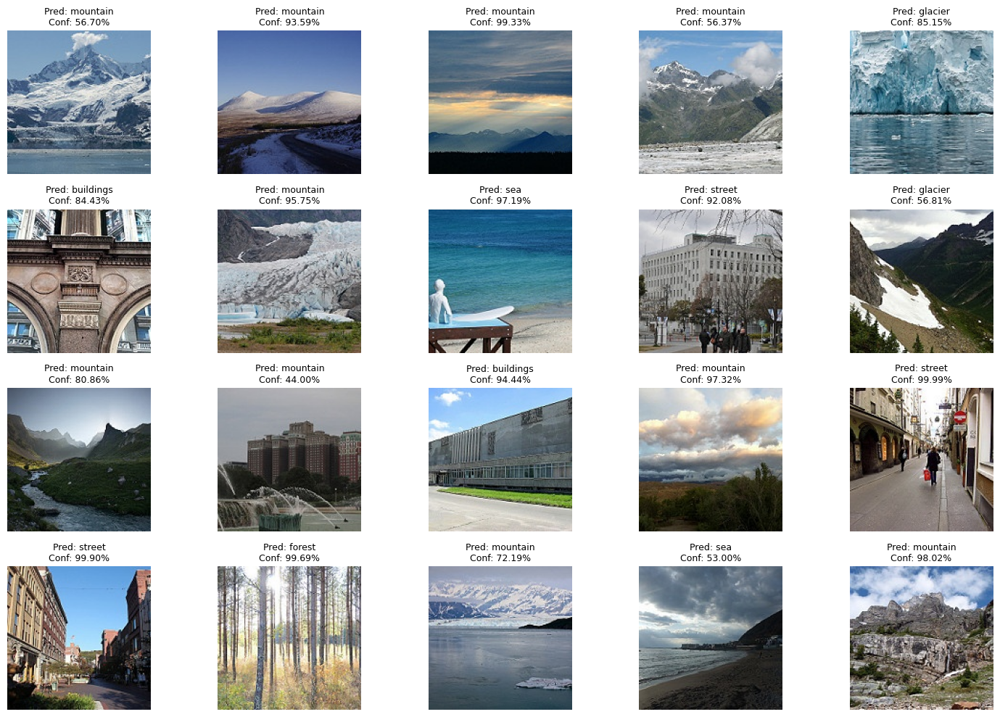

In [ ]:
image_paths = list(PREDICTION_DATA_DIRECTORY.glob("*.jpg"))
# Limitar a 20 imágenes
sample_image_paths = image_paths[:20]

# Cargar imágenes
sample_images = []
for path in sample_image_paths:
    img = load_img(path, target_size=(IMAGE_HEIGHT, IMAGE_WIDTH))
    img_array = img_to_array(img)
    sample_images.append(img_array)

# Convertir a tensor y no es necesario escalar
sample_images = np.array(sample_images)

predictions = model_resi.predict(sample_images)

fig, axes = plt.subplots(4, 5, figsize=(15, 10))
for idx, ax in enumerate(axes.flat):
    img = sample_images[idx]
    predict_class = class_names[np.argmax(predictions[idx])]
    confidence = np.max(predictions[idx]) * 100

    ax.imshow(img.astype("uint8"))
    ax.set_title(f"Pred: {predict_class}\nConf: {confidence:.2f}%", fontsize=9)
    ax.axis('off')

plt.tight_layout()
plt.show()

# Modelo que utilice como backbone alguna de las arquitecturas disponibles en TensorFlow

## Construcción del modelo

In [ ]:
def build_transfer_model(input_shape, num_classes):
  inputs = Input(shape=input_shape)

  # Backbone
  # base_model = tf.keras.applications.EfficientNetB0(
  base_model = tf.keras.applications.MobileNetV3Small(
    input_shape=input_shape,
    include_top=False,
    weights='imagenet',
    pooling = max
)
  base_model.trainable = False

  i = Input(input_shape)
  x = RandomFlip("horizontal_and_vertical")(i)
  x = RandomContrast(0.2)(x)
  x = RandomTranslation(0.1, 0.1)(x)
  x = base_model(x, training = False)

  # Head
  x = Flatten()(x)
  x = Dense(64, activation='relu')(x)
  x = Dense(num_classes, activation='softmax')(x)

  return tf.keras.Model(i, x)

In [ ]:
print("Building model")
model_backbone = build_transfer_model((IMAGE_HEIGHT, IMAGE_WIDTH, 3), num_classes)

model_backbone.summary()

Building model


/usr/local/lib/python3.11/dist-packages/keras/src/applications/mobilenet_v3.py:452: UserWarning: `input_shape` is undefined or non-square, or `rows` is not 224. Weights for input shape (224, 224) will be loaded as the default.
  return MobileNetV3(


4334752/4334752 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)      │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_flip_4 (RandomFlip)      │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_contrast_4               │ (None, 150, 150, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_translation_4            │ (None, 150, 150, 3)    │             0 │
│ (RandomTranslation)             │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MobileNetV3Small (Functional)   │ (None, 5, 5, 576)      │       939,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 14400)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 64)             │       921,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 6)              │           390 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,861,174 (7.10 MB)

 Trainable params: 922,054 (3.52 MB)

 Non-trainable params: 939,120 (3.58 MB)

## Entrenamiento

In [ ]:
model_backbone.compile(
    optimizer='adam',
    loss="categorical_crossentropy",
    metrics=['accuracy'])

In [ ]:
EPOCHS = 200
early_stopping = EarlyStopping(monitor="val_loss", patience=20, verbose=0, mode="min")
checkpoint_acc = ModelCheckpoint(
    "model_backbone-e{epoch:02d}-loss{val_loss:.3f}-acc{val_accuracy:.3f}.keras",
    save_best_only=True,
    monitor="val_accuracy",
    initial_value_threshold=0.7,
    mode="max",
)

# Entrenar el modelo
history = model_backbone.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=[checkpoint_acc, early_stopping],
)

Epoch 1/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 17s 170ms/step - accuracy: 0.6649 - loss: 1.2800 - val_accuracy: 0.8643 - val_loss: 0.3763
Epoch 2/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 6s 110ms/step - accuracy: 0.8685 - loss: 0.3577 - val_accuracy: 0.8847 - val_loss: 0.3307
Epoch 3/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - accuracy: 0.8887 - loss: 0.3119 - val_accuracy: 0.8890 - val_loss: 0.3122
Epoch 4/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - accuracy: 0.9014 - loss: 0.2719 - val_accuracy: 0.8877 - val_loss: 0.3164
Epoch 5/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.9042 - loss: 0.2528 - val_accuracy: 0.8763 - val_loss: 0.3336
Epoch 6/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 9s 107ms/step - accuracy: 0.9133 - loss: 0.2345 - val_accuracy: 0.8820 - val_loss: 0.3231
Epoch 7/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - accuracy: 0.9201 - loss: 0.2163 - val_accuracy: 0.8900 - val_loss: 0.3262
Epoch 8/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - accuracy: 0.9205 - loss: 0.2116 - val_ac

Al haber solo 900k de parámetros entrenables, y estos viniendo de una capa completamente conectada, el modelo se entrena mucho más rápido que los 2 anteriores (y además que la extracción de features de la imagen ya se encuentra preentrenada).

## Gráficas de precisión y pérdida en entrenamiento y validación

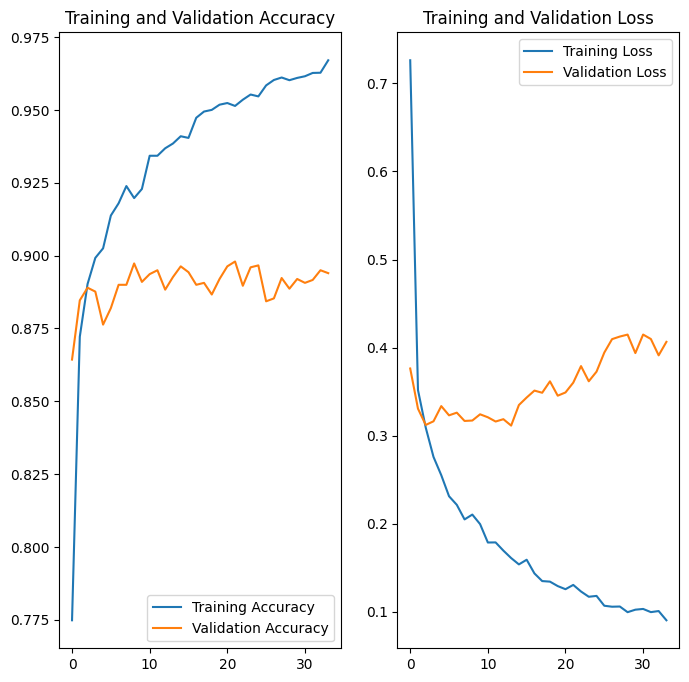

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

En éstas gráficas se nota un claro overfitting del modelo, a pesar de que utilizamos el backbone más chico que encontramos, este tiene una potencia mucho mayor de lo necesaria para este problema. Se podría intentar utilizar menos neuronas en la capa completamente conectada.

## Predicciones

Con datos de validación

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


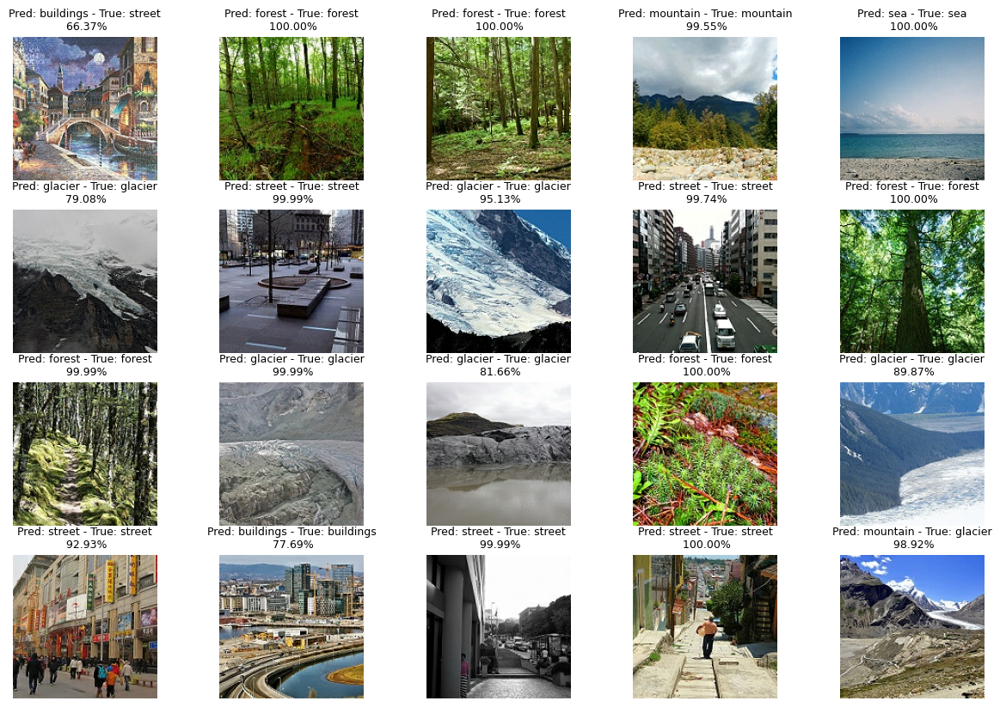

In [ ]:
# Obtener un batch de val_ds (32 imagenes por batch)
for images, labels in val_ds.take(1):
  sample_images = images[:20]
  sample_labels = labels[:20]
  break

predictions = model_backbone.predict(sample_images)

# Crear subplot 4 x 5
fig, axes = plt.subplots(4, 5, figsize=(15, 10))

for idx, ax in enumerate(axes.flat):
  img = sample_images[idx]
  predict_class = class_names[np.argmax(predictions[idx])]
  true_class = class_names[np.argmax(sample_labels[idx])]
  confidence = np.max(predictions[idx]) * 100

  ax.imshow(img.numpy().astype("uint8"))
  ax.set_title(f"Pred: {predict_class} - True: {true_class}\n {confidence:.2f}%", fontsize=9)
  ax.axis('off')

plt.show()

Con datos de testeo

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


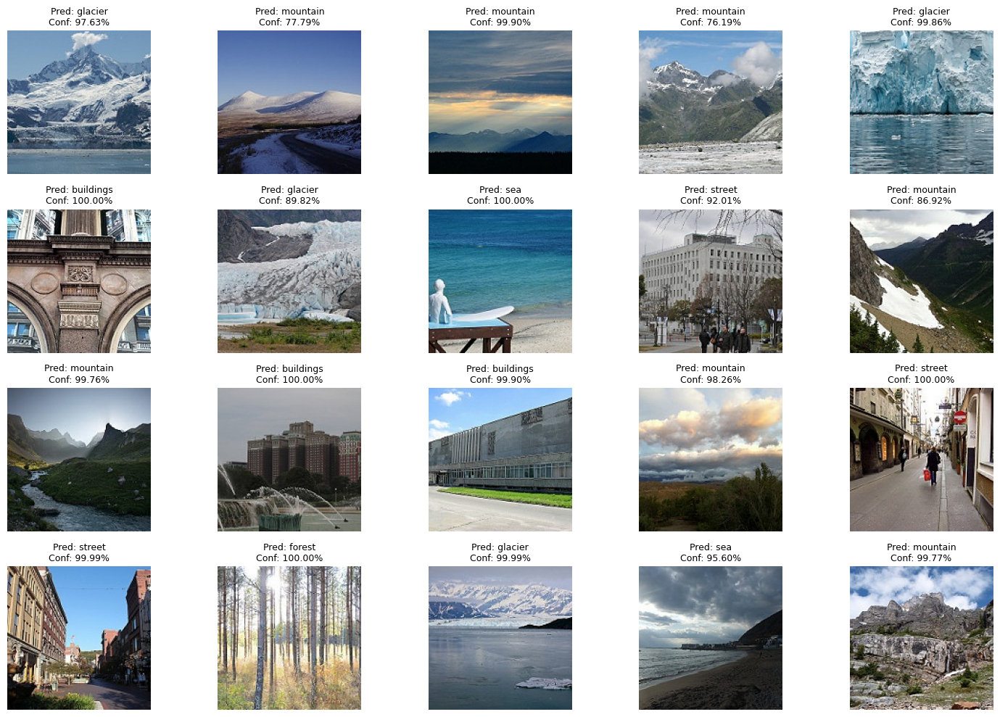

In [ ]:
image_paths = list(PREDICTION_DATA_DIRECTORY.glob("*.jpg"))

# Limitar a 20 imágenes
sample_image_paths = image_paths[:20]

# Cargar imágenes
sample_images = []
for path in sample_image_paths:
    img = load_img(path, target_size=(IMAGE_HEIGHT, IMAGE_WIDTH))
    img_array = img_to_array(img)
    sample_images.append(img_array)

# Convertir a tensor y escalar si es necesario
sample_images = np.array(sample_images) #/ 255.0  # normalizar ?

# Hacer predicciones
predictions = model_backbone.predict(sample_images)

# Mostrar resultados
fig, axes = plt.subplots(4, 5, figsize=(15, 10))
for idx, ax in enumerate(axes.flat):
    img = sample_images[idx]
    predict_class = class_names[np.argmax(predictions[idx])]
    confidence = np.max(predictions[idx]) * 100

    ax.imshow(img.astype("uint8"))
    ax.set_title(f"Pred: {predict_class}\nConf: {confidence:.2f}%", fontsize=9)
    ax.axis('off')

plt.tight_layout()
plt.show()


En la mayoría de las predicciones la confianza es alta y su clasificación es casi perfecta, notándose muy pocos errores.

# Conclusión

> Este trabajo permitió comparar distintas arquitecturas de redes neuronales aplicadas a la clasificación de imágenes naturales.
>
>Se observó que las redes convolucionales ofrecen un equilibrio óptimo entre rendimiento y complejidad, superando ampliamente a las redes densas.
>
>Los bloques residuales aportan profundidad, pero su complejidad no se tradujo en mejor rendimiento en este caso.
>
>Por último, los modelos con *transfer learning* demostraron un excelente desempeño con muy pocos parámetros entrenables, aunque requirieron cuidado para evitar sobreajuste.
>
>En conclusión, el modelo convolucional clásico fue el más robusto para este conjunto de datos, cumpliendo los objetivos del trabajo.

### 🔹 Modelo Denso (Dense)
* Arquitectura completamente conectada sin convoluciones
* Precisión en validación: 54%
* Número de parámetros: ~8.6M
* Buen punto de partida, pero limitado para imágenes

### 🔹 Modelo Convolucional
* Arquitectura: Conv2D + MaxPooling + Dense
* Precisión en validación: ~86%
* Parámetros: ~148K
* Balance ideal entre precisión y tamaño

### 🔹 Modelo con Bloques Residuales (Identidad)
* Uso de Add() y conexiones tipo ResNet
* Precisión en validación: ~75%
* Parámetros: ~552K
* Riesgo de sobreajuste sin aumento de datos

### 🔹 Modelo con Backbone (Transfer Learning)
* Utiliza MobileNetV3Small con pesos de ImageNet
* Precisión en validación: ~90% aunque muestra overfitting
* Parámetros:  
  * Totales: ~1861k
  * Entrenables: ~922K
* Rápido entrenamiento gracias al conocimiento previo del modelo